In [2]:
import os
from os.path import exists
import torch
import torch.nn as nn
from torch.nn.functional import log_softmax, pad
import math
import copy
import time
from torch.optim.lr_scheduler import LambdaLR
import pandas as pd
import altair as alt
from torchtext.data.functional import to_map_style_dataset
from torch.utils.data import DataLoader
from torchtext.vocab import build_vocab_from_iterator
import torchtext.datasets as datasets
import spacy
import GPUtil
import warnings
from torch.utils.data.distributed import DistributedSampler
import torch.distributed as dist
import torch.multiprocessing as mp
from torch.nn.parallel import DistributedDataParallel as DDP


import numpy as np          # 导入NumPy库，用于进行矩阵运算和数据处理
import torch                # 导入PyTorch库，用于构建神经网络及相关操作
import torch.nn as nn       # 导入PyTorch神经网络模块，用于构建神经网络层
import torch.nn.functional as F  # 导入PyTorch神经网络函数库，用于激活函数、损失函数等
import math, copy, time          # 导入数学库、复制库和时间库，用于各种数学计算、复制操作和计时
from torch.autograd import Variable  # 从PyTorch自动微分库中导入Variable类，用于构建自动微分计算图
import matplotlib.pyplot as plt      # 导入Matplotlib的pyplot模块，用于绘制图表和可视化
import seaborn                       # 导入Seaborn库，用于绘制统计图形和美化图表


In [8]:
seaborn.set_context(context="talk")  # 设置Seaborn的上下文环境，设置图表的尺寸和标签字体大小等
# %matplotlib inline                   # IPython魔术命令，使Matplotlib绘制的图形直接显示在Notebook内


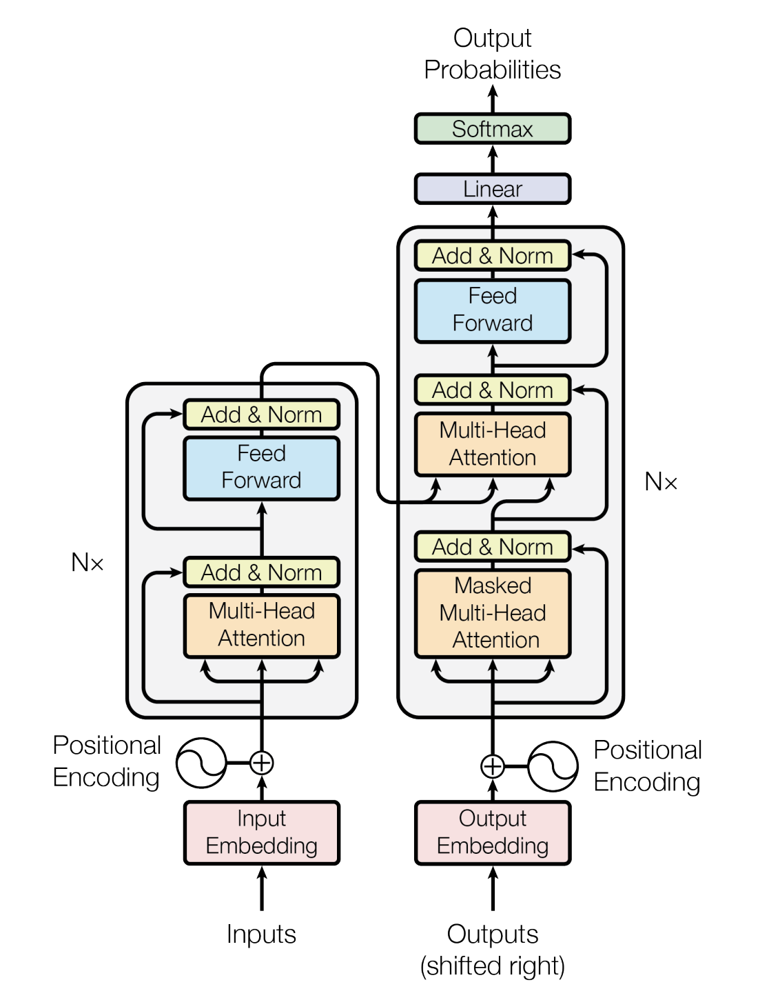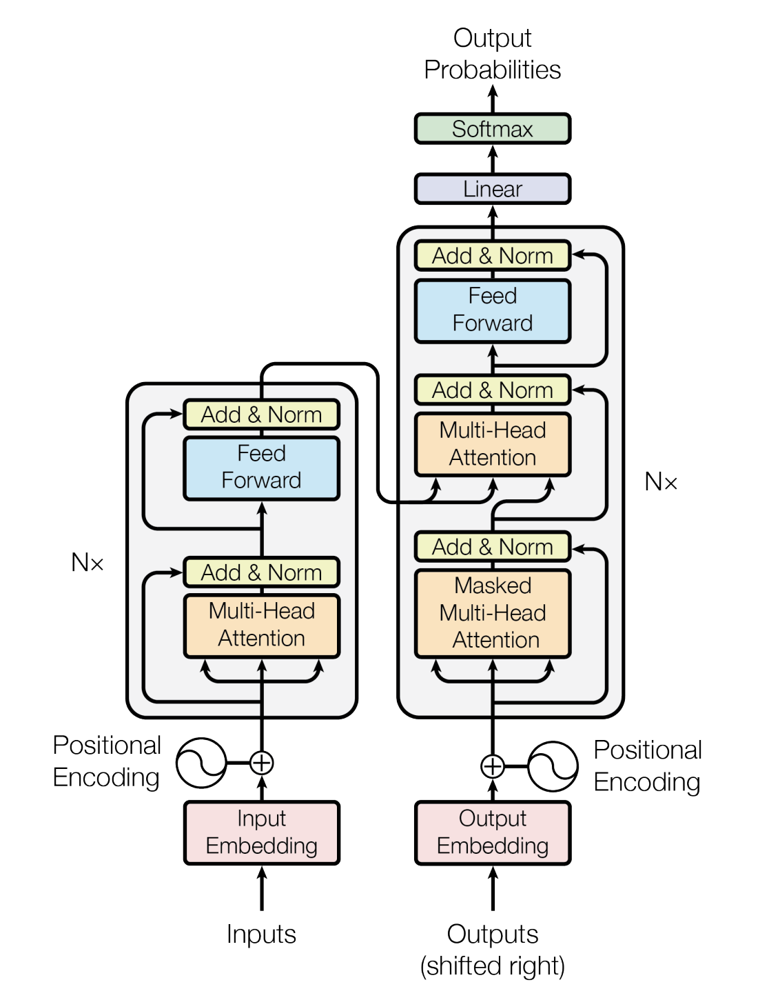

The Transformer follows this overall architecture using stacked self-attention and point-wise, fully connected layers for both the encoder and decoder, shown in the left and right halves of Figure 1, respectively.



# 1. Encoder Module

In [9]:
class EncoderDecoder(nn.Module):
    """
      A standard Encoder-Decoder architecture. Base for this and many
      other models.
    """

    def __init__(self, encoder, decoder, src_embed, tgt_embed, generator):
        # 确保EncoderDecoder类正确继承和初始化其父类nn.Module
        super(EncoderDecoder, self).__init__()
        self.encoder = encoder  # 将传入的编码器实例保存为类属性
        self.decoder = decoder  # 将传入的解码器实例保存为类属性
        self.src_embed = src_embed  # 将传入的源嵌入实例保存为类属性
        self.tgt_embed = tgt_embed  # 将传入的目标嵌入实例保存为类属性
        self.generator = generator  # 将传入的生成器实例保存为类属性


    # 前向传播方法，接收源序列、目标序列和它们的掩码作为参数
    def forward(self, src, tgt, src_mask, tgt_mask):
        # 对源序列进行编码，并将编码结果与掩码传递给解码器进行解码
        return self.decode(self.encode(src, src_mask), src_mask, tgt, tgt_mask)

    # 编码方法，接收源序列和掩码作为参数
    def encode(self, src, src_mask):
        # 将源序列进行嵌入，然后将嵌入后的序列和源序列掩码传给编码器
        return self.encoder(self.src_embed(src), src_mask)

    # 解码方法，接收编码器输出（memory）、源序列掩码、目标序列和目标序列掩码作为参数
    def decode(self, memory, src_mask, tgt, tgt_mask):
        # 将目标序列进行嵌入，然后将嵌入后的序列、编码器输出、源序列掩码和目标序列掩码传给解码器
        return self.decoder(self.tgt_embed(tgt), memory, src_mask, tgt_mask)


In [10]:
class Generator(nn.Module):
    "Define standard linear + softmax generation step."

    def __init__(self, d_model, vocab):
        super(Generator, self).__init__()
        """
            这一层是输出层，所以输出的shape是 sequence_size * vocab_size, 最后通过log_softmax对vocab这个维度进行归一化，找到概率最大的词汇
            Examples:
            >>> m = nn.Linear(20, 30)
            >>> input = torch.randn(128, 20)
            >>> output = m(input)
            >>> print(output. size())
            torch.Size([128, 30])
        """
        self.proj = nn.Linear(d_model, vocab)

    def forward(self, x):
        # 将输入 x 传入线性层，然后对输出应用 log-softmax 激活函数（在最后一个维度上）
        """
        这个函数首先计算softmax，然后将结果取自然对数（logarithm）。这样做的好处是可以增加数值稳定性，特别是在处理非常小的概率值时。
        log_softmax函数中的参数dim=-1指定了在哪个维度上进行softmax操作。在Python中，负数索引表示从数组的末尾开始计数，因此dim=-1指的是最后一个维度。
        例如，假设你有一个二维张量（tensor），其形状为(batch_size, num_classes)，其中batch_size是批次中样本的数量，
        num_classes是类别的数量。如果你在这个张量上调用log_softmax(dim=-1)，
        那么softmax操作将会沿着num_classes这个维度进行，即每个样本的输出向量都会进行softmax归一化。
        """
        return log_softmax(self.proj(x), dim=-1)


# 1.1 Input process: embeddings + positional encoding

### 1.1.1 input embeddings

* 如果每句话都临时抱佛脚去生成对应的词向量，则处理起来无疑会费时费力，所以在实际应用中，会事先预训练好各种embedding矩阵，这些embedding矩阵包含常用领域常用单词的向量化表示，且提前做好分词。
* 当模型接收到某个句子时，便可以从对应的embedding矩阵里查找对应的词向量，最终把整句输入转换成对应的向量表示。（lut: look up table）

In [11]:
# an Embedding module containing 10 tensors of size 3
# 1st argument: num_embeddings (int): size of the dictionary of embeddings
# 2nd argument: embedding_dim (int): the size of each embedding vector
embedding = nn.Embedding(10, 3)
print(type(embedding))
# a batch of 2 samples of 4 indices each
input = torch.LongTensor([[1,2,4,5],[4,3,2,9]])
output = embedding(input)
print(output)
# Input: (*), IntTensor or LongTensor of arbitrary shape containing the indices to extract
# Output: (*, H), where * is the input shape and H = embedding_dim which is 3 in this case
# the shape is [2,4,3]
print(np.shape(output))

<class 'torch.nn.modules.sparse.Embedding'>
tensor([[[ 0.3015, -1.5924,  0.6776],
         [ 0.0523, -1.0468,  0.5294],
         [-0.3322,  0.5256,  1.0823],
         [-0.1875,  1.6990,  1.0458]],

        [[-0.3322,  0.5256,  1.0823],
         [ 0.9298,  0.2289, -0.1035],
         [ 0.0523, -1.0468,  0.5294],
         [-0.2091,  1.4299,  1.0857]]], grad_fn=<EmbeddingBackward0>)
torch.Size([2, 4, 3])


In [5]:
class Embeddings(nn.Module):
    def __init__(self, d_model, vocab):
        # 调用父类nn.Module的初始化方法
        super(Embeddings, self).__init__()
        # 创建一个词嵌入层，参数为词汇表大小和词嵌入维度
        # vocab：一个整数，表示词汇表的大小，即有多少个不同的词汇（或token）。每个词汇都会被映射到一个唯一的整数索引上。 e.g: 37000
        # d_model：一个整数，表示每个嵌入向量的维度。这个维度决定了每个词汇在嵌入空间中的表示的复杂度。e.g: 512
        # nn.Embedding 返回一个嵌入查找表（lookup table），其中每个索引对应一个 d_model 维的向量。
        self.lut = nn.Embedding(vocab, d_model)
        # 将词嵌入维度保存为类属性
        self.d_model = d_model

    def forwad(self, x):
        # 通过词嵌入层将输入的单词编码为向量，并乘以词嵌入维度的平方根进行缩放(作为缩放因子)
        # Shape:
        # Input: (*), IntTensor or LongTensor of arbitrary shape containing the indices to extract
        # Output: (*, H), where * is the input shape and H = embedding_dim
        # 最后输出的shape是 [shape(x), embedding_dim]
        return self.lut(x) * math.sqrt(self.d_model)

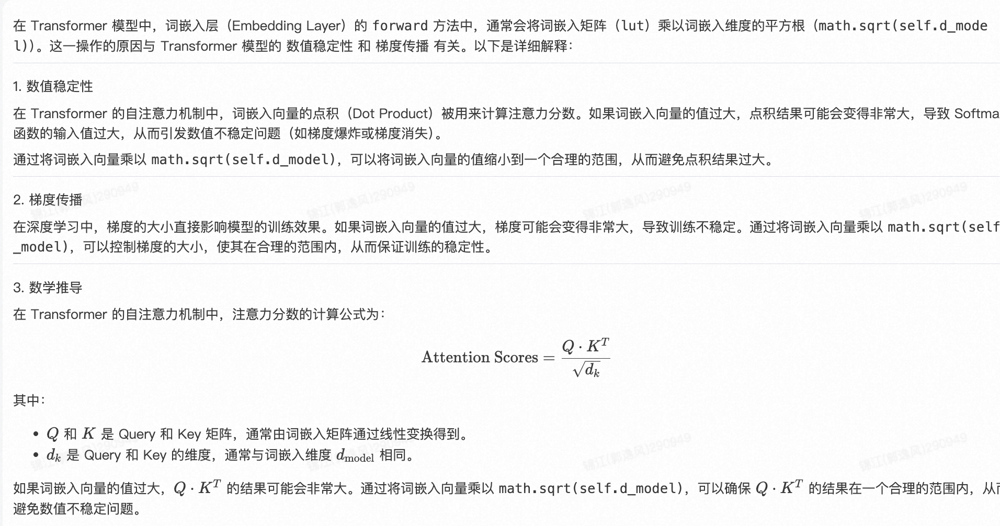

### 1.1.2 positional encoding

* 句子中token与token的顺序关系（相对位置、绝对位置）通过位置编码保存
* 位置编码的的维度与embedding一致，都为$d_{model}$
* 不同于RNN、CNN等模型，对于Transformer模型来说，位置编码的加入是必不可少的，因为纯粹的Attention模块是无法捕捉输入顺序的，即无法区分不同位置的Token。为此我们大体有两个选择：1、想办法将位置信息融入到输入中，这构成了绝对位置编码的一般做法；2、想办法微调一下Attention结构，使得它有能力分辨不同位置的Token，这构成了相对位置编码的一般做法。

文章参考：
* 让研究人员绞尽脑汁的Transformer位置编码： https://kexue.fm/archives/8130
* 博采众长的旋转式位置编码： https://kexue.fm/archives/8265
* 旋转位置编码RoPE论文：https://arxiv.org/abs/2104.09864

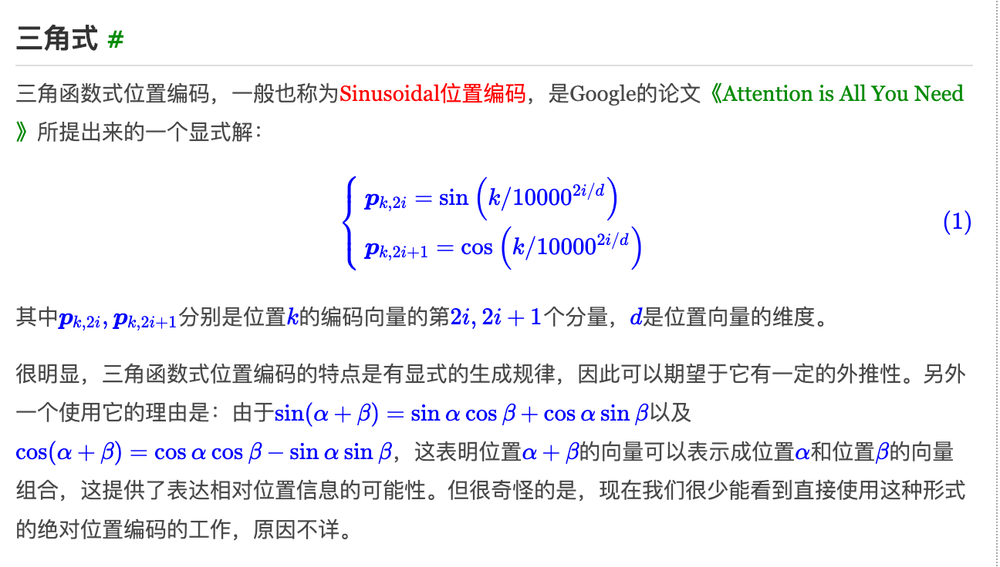

#### 1.1.2.1 相对位置编码

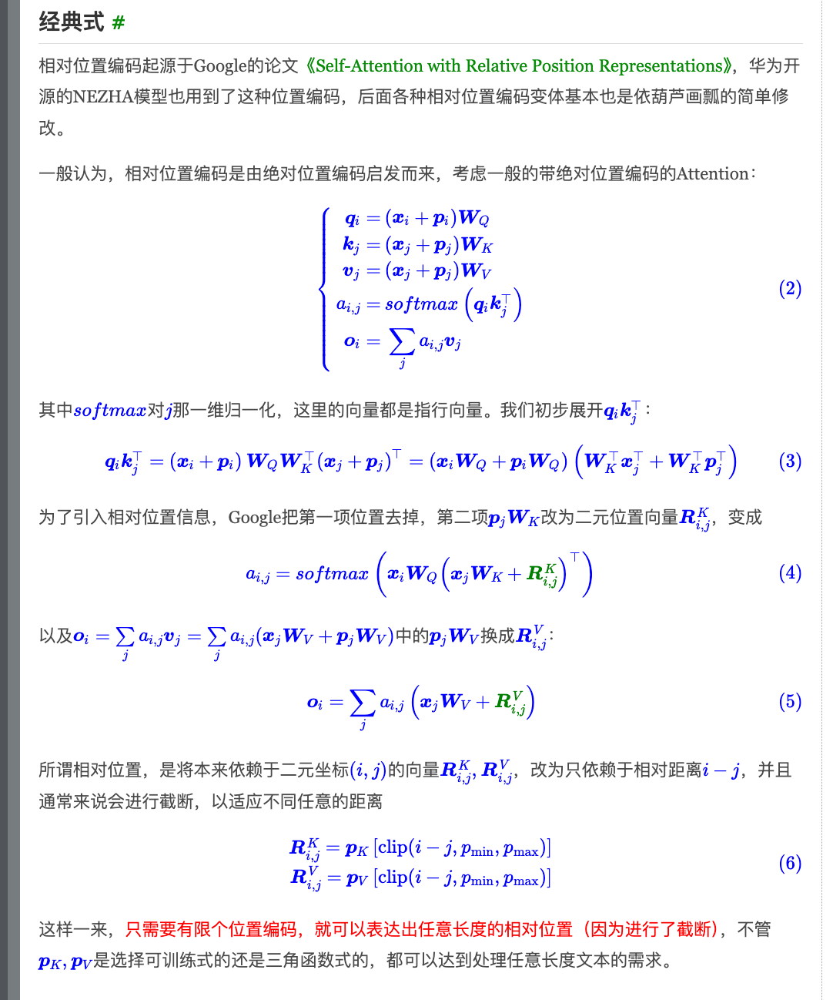

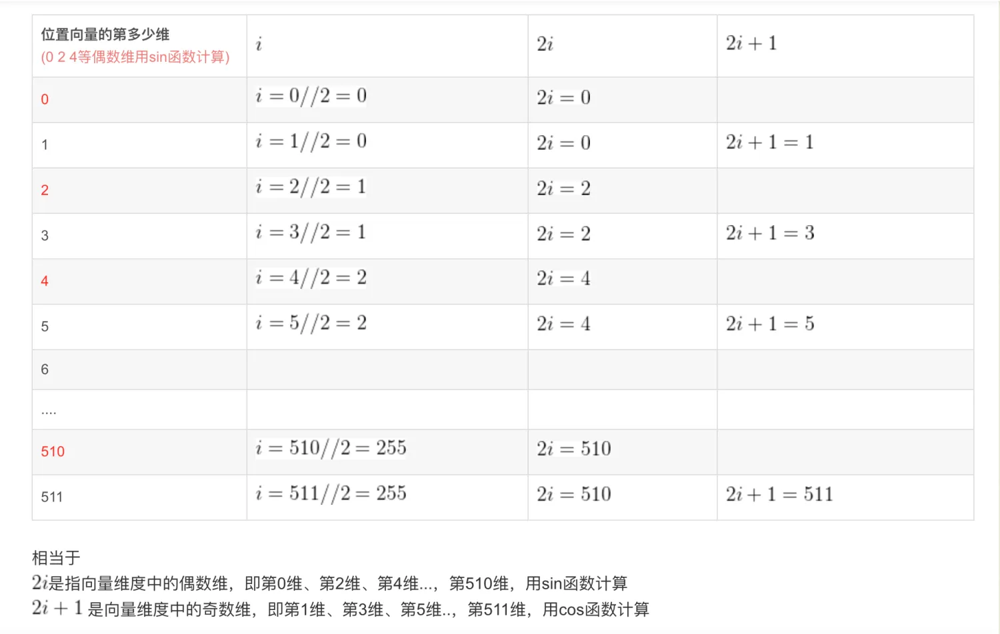

#### 1.1.2.2 位置编码实现

In [41]:
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout, max_length=5000):
        super(PositionalEncoding, self).__init__()
        # 初始化dropout层,通过dropout层防止模型过拟合。
        # p 是 nn.Dropout 类的参数，表示丢弃神经元的概率。例如，p=0.1 表示在每次训练迭代中，网络中每个神经元有 50% 的概率被丢弃。
        # Dropout 只在训练阶段生效。在推理阶段（使用 model.eval() 时），Dropout 层会被禁用，所有神经元都会被保留。
        self.dropout = nn.Dropout(p=dropout) 

        # 计算位置编码并将其存储在pe张量中
        # 此时pe shape: [max_length, d_model]
        pe = torch.zeros(max_length, d_model) # 创建一个max_len x d_model的全零张量

        # unsqueeze 是 PyTorch 中的一个操作，用于在指定的维度上添加一个大小为 1 的维度。它的作用是调整张量的形状，而不改变其数据。
        # position shape" [max_length, 1]
        position = torch.arange(0, max_len).unsqueeze(1)  # 生成0到max_len-1的整数序列，表示位置索引，并添加一个维度

        # 计算div_term，用于缩放不同位置的正弦和余弦函数
        # 为什么先转换为了等价的指数+对数运算，而不是直接幂运算？
        # 1. 直接使用幂运算可能会导致数值上溢或下溢。当d_model较大时，10000.0 ** (-i / d_model)中的幂可能会变得非常小，
        # 以至于在数值计算中产生下溢。通过将其转换为指数和对数运算，可以避免这种情况，因为这样可以在计算过程中保持更好的数值范围
        # 2. 在许多计算设备和库中，指数和对数运算的实现通常比幂运算更快。
        # 这主要是因为指数和对数运算在底层硬件和软件中有特定的优化实现，而幂运算通常需要计算更多的中间值
        # torch.arange(0, d_model, 2)为0~d_model的偶数序列,即公式中的2i表示 
        div_term = torch.exp(torch.arange(0, d_model, 2) * -(math.log(10000.0) / d_model)) # dim_term shape: [d_model // 2]

        # 使用正弦和余弦函数生成位置编码，对于d_model的偶数索引，使用正弦函数；对于奇数索引，使用余弦函数。
        # 对张量 pe 进行切片操作. : 表示选择所有行。
        # position 的形状是 [max_length, 1]。div_term 的形状是 [d_model // 2]
        # 通过广播机制，position * div_term 的形状为 [max_length, d_model // 2]。 所以偶数维和奇数维正好与pe的shape一致
        pe[:, 0::2] = torch.sin(position * div_term) # 0::2 表示从第 0 列开始，每隔 2 列选择一次，即选择偶数列。
        pe[:, 1::2] = torch.cos(position * div_term) # 1::2 表示从第 1 列开始，每隔 2 列选择一次，即选择奇数列。
        pe = pe.unsqueeze(0)                  # 在第一个维度添加一个维度，以便进行批处理， shape = [1, max_length, d_model]
        self.register_buffer('pe', pe)        # 将位置编码张量注册为缓冲区，以便在不同设备之间传输模型时保持其状态
        
    # 定义前向传播函数
    def forward(self, x):
        # 将输入x与对应的位置编码相加
        x = x + Variable(self.pe[:, :x.size(1)], 
                         requires_grad=False)
        # 应用dropout层并返回结果
        return self.dropout(x)

        
         
        

#### 1.1.2.3 torch.unqueeze测试


In [39]:
t = torch.arange(0, 5)
print(t)
res= t.unsqueeze(1)
print("t.unsqueeze(1)输出:\n " + str(res))

res_0 = res.unsqueeze(0)
print("res_0 shape: " + str(np.shape(res_0))) # [5,1] 在第0个维度增加一个维度后，变为 [1,5,1]的shape


res1 = torch.arange(0, 10, 2)
print("torch.arange(0, 10, 2) 输出:\n" + str(res1))


tensor([0, 1, 2, 3, 4])
t.unsqueeze(1)输出:
 tensor([[0],
        [1],
        [2],
        [3],
        [4]])
res_0 shape: torch.Size([1, 5, 1])
torch.arange(0, 10, 2) 输出:
tensor([0, 2, 4, 6, 8])


#### 1.1.2.4 div_term = torch.exp(torch.arange(0, d_model, 2) * -(math.log(10000.0) / d_model)) 理解

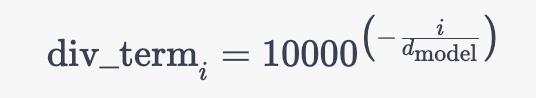

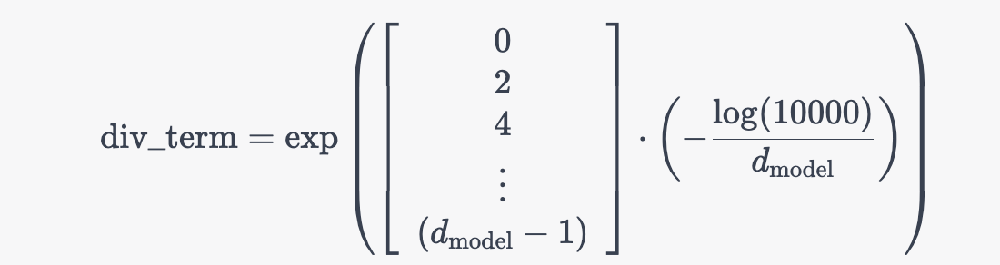


上述两个公式是等价的。其中的中括号对应的是一个从 0 到 d_model - 1 的等差数列(步长为 2)，设为i。表示偶数维的位置编码索引
原因在于: <br>
$ a^x=e^{(x\cdot ln(a))} $，从而有$ 10000^{-\frac{i}{d_{model}}}=e^{(-\frac{i}{d_{model}}\cdot log(10000))} $